# Quick Start: Running TabPFN-TS on gift-eval benchmark

This notebook shows how to run TabPFN-TS on the gift-eval benchmark.

Make sure you download the gift-eval benchmark and set the `GIFT-EVAL` environment variable correctly before running this notebook.

We will use the `Dataset` class to load the data and run the model. If you have not already please check out the [dataset.ipynb](./dataset.ipynb) notebook to learn more about the `Dataset` class. We are going to just run the model on two datasets for brevity. But feel free to run on any dataset by changing the `short_datasets` and `med_long_datasets` variables below.

## Setting up TabPFN-TS

### Installation

The predictor class of TabPFN-TS is included in `tabpfn-time-series` repository but not in the pip package. So we need to install it manually.

1. Clone the TabPFN-TS repository
2. Add the file to the Python path

In [28]:
# !git clone https://github.com/PriorLabs/tabpfn-time-series.git
# !cd tabpfn-time-series && git checkout v1.0.0
# %pip install -r tabpfn-time-series/requirements.txt
import warnings
warnings.filterwarnings("ignore")

In [29]:
import sys
import os
from pathlib import Path
# Add both the main repository and the gift_eval subdirectory to the path
sys.path.append(os.path.abspath("tabpfn-time-series"))
sys.path.append(os.path.abspath("tabpfn-time-series/gift_eval"))
print("Added tabpfn-time-series to Python path")

# Import the TabPFN time series predictor class
# This is the main class we'll use for forecasting
from tabpfn_ts_wrapper import TabPFNTSPredictor, TabPFNMode

Added tabpfn-time-series to Python path


### TabPFN-TS Configuration

TabPFN-TS offers two ways to run the model:
1. `TabPFNMode.LOCAL`: Run the model on the local machine (requires GPU)
2. `TabPFNMode.CLIENT`: Run the model on the cloud (via `tabpfn-client`)

In this notebook, we will use `TabPFNMode.LOCAL` mode.


In [30]:
GIFT_EVAL_TABPFN_MODE = TabPFNMode.LOCAL

## Setting up the data and metrics

In [31]:
import json

from dotenv import load_dotenv

# Load environment variables
load_dotenv()

# short_datasets = "m4_yearly m4_quarterly m4_monthly m4_weekly m4_daily m4_hourly electricity/15T electricity/H electricity/D electricity/W solar/10T solar/H solar/D solar/W hospital covid_deaths us_births/D us_births/M us_births/W saugeenday/D saugeenday/M saugeenday/W temperature_rain_with_missing kdd_cup_2018_with_missing/H kdd_cup_2018_with_missing/D car_parts_with_missing restaurant hierarchical_sales/D hierarchical_sales/W LOOP_SEATTLE/5T LOOP_SEATTLE/H LOOP_SEATTLE/D SZ_TAXI/15T SZ_TAXI/H M_DENSE/H M_DENSE/D ett1/15T ett1/H ett1/D ett1/W ett2/15T ett2/H ett2/D ett2/W jena_weather/10T jena_weather/H jena_weather/D bitbrains_fast_storage/5T bitbrains_fast_storage/H bitbrains_rnd/5T bitbrains_rnd/H bizitobs_application bizitobs_service bizitobs_l2c/5T bizitobs_l2c/H"
short_datasets = "m4_weekly"

# med_long_datasets = "electricity/15T electricity/H solar/10T solar/H kdd_cup_2018_with_missing/H LOOP_SEATTLE/5T LOOP_SEATTLE/H SZ_TAXI/15T M_DENSE/H ett1/15T ett1/H ett2/15T ett2/H jena_weather/10T jena_weather/H bitbrains_fast_storage/5T bitbrains_rnd/5T bizitobs_application bizitobs_service bizitobs_l2c/5T bizitobs_l2c/H"
med_long_datasets = "bitbrains_rnd/5T"

# Get union of short and med_long datasets
all_datasets = list(set(short_datasets.split() + med_long_datasets.split()))
# all_datasets = ["bull"]

dataset_properties_map = json.load(open("dataset_properties.json"))

In [32]:
from gluonts.ev.metrics import (
    MAE,
    MAPE,
    MASE,
    MSE,
    MSIS,
    ND,
    NRMSE,
    RMSE,
    SMAPE,
    MeanWeightedSumQuantileLoss,
)

# Instantiate the metrics
metrics = [
    MSE(forecast_type="mean"),
    MSE(forecast_type=0.5),
    MAE(),
    MASE(),
    MAPE(),
    SMAPE(),
    MSIS(),
    RMSE(),
    NRMSE(),
    ND(),
    MeanWeightedSumQuantileLoss(
        quantile_levels=[0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
    ),
]

## Evaluation

Since `tabpfn-time-series` has implemented the predictor class, we can use it to predict on the gift-eval benchmark datasets. We will use the `evaluate_model` function to evaluate the model. This function is a helper function to evaluate the model on the test data and return the results in a dictionary. We are going to follow the naming conventions explained in the [README](../README.md) file to store the results in a csv file called `all_results.csv` under the `results/tabpfn_ts` folder.

The first column in the csv file is the dataset config name which is a combination of the dataset name, frequency and the term:

```python
f"{dataset_name}/{freq}/{term}"
```


In [33]:
import logging


class WarningFilter(logging.Filter):
    def __init__(self, text_to_filter):
        super().__init__()
        self.text_to_filter = text_to_filter

    def filter(self, record):
        return self.text_to_filter not in record.getMessage()


gts_logger = logging.getLogger("gluonts.model.forecast")
gts_logger.addFilter(
    WarningFilter("The mean prediction is not stored in the forecast data")
)

In [34]:
import csv
import os

from gluonts.model import evaluate_model
from gluonts.time_feature import get_seasonality

# from .gift_eval.data import Dataset
from data import Dataset

# Iterate over all available datasets
model_name = "tabpfn_ts"
output_dir = f"results_gifteval_notebook/{model_name}"
# Ensure the output directory exists
os.makedirs(output_dir, exist_ok=True)

# Define the path for the CSV file
csv_file_path = os.path.join(output_dir, "all_results.csv")

pretty_names = {
    "saugeenday": "saugeen",
    "temperature_rain_with_missing": "temperature_rain",
    "kdd_cup_2018_with_missing": "kdd_cup_2018",
    "car_parts_with_missing": "car_parts",
}

with open(csv_file_path, "w", newline="") as csvfile:
    writer = csv.writer(csvfile)

    # Write the header
    writer.writerow(
        [
            "dataset",
            "model",
            "eval_metrics/MSE[mean]",
            "eval_metrics/MSE[0.5]",
            "eval_metrics/MAE[0.5]",
            "eval_metrics/MASE[0.5]",
            "eval_metrics/MAPE[0.5]",
            "eval_metrics/sMAPE[0.5]",
            "eval_metrics/MSIS",
            "eval_metrics/RMSE[mean]",
            "eval_metrics/NRMSE[mean]",
            "eval_metrics/ND[0.5]",
            "eval_metrics/mean_weighted_sum_quantile_loss",
            "domain",
            "num_variates",
        ]
    )

for ds_num, ds_name in enumerate(all_datasets):
    ds_key = ds_name.split("/")[0]
    print(f"Processing dataset: {ds_name} ({ds_num + 1} of {len(all_datasets)})")
    terms = ["short", "medium", "long"]
    for term in terms:
        if (
            term == "medium" or term == "long"
        ) and ds_name not in med_long_datasets.split():
            continue

        if "/" in ds_name:
            ds_key = ds_name.split("/")[0]
            ds_freq = ds_name.split("/")[1]
            ds_key = ds_key.lower()
            ds_key = pretty_names.get(ds_key, ds_key)
        else:
            ds_key = ds_name.lower()
            ds_key = pretty_names.get(ds_key, ds_key)
            ds_freq = dataset_properties_map[ds_key]["frequency"]
        ds_config = f"{ds_key}/{ds_freq}/{term}"

        # Initialize the dataset
        to_univariate = (
            False
            if Dataset(name=ds_name, term=term, to_univariate=False, storage_path=Path('data')).target_dim == 1
            else True
        )
        dataset = Dataset(name=ds_name, term=term, to_univariate=to_univariate, storage_path=Path('data'))
        season_length = get_seasonality(dataset.freq)
        print(f"Dataset size: {len(dataset.test_data)}\n")
        print(f"Rosen how many variants: {len(dataset.test_data.dataset)}\n")
        
        predictor = TabPFNTSPredictor(
            ds_prediction_length=dataset.prediction_length,
            ds_freq=dataset.freq,
            tabpfn_mode=GIFT_EVAL_TABPFN_MODE,
            context_length=4096,
        )
        # Measure the time taken for evaluation
        res = evaluate_model(
            predictor,
            test_data=dataset.test_data,
            metrics=metrics,
            batch_size=1024,
            axis=None,
            mask_invalid_label=True,
            allow_nan_forecast=False,
            seasonality=season_length,
        )

        # Append the results to the CSV file
        with open(csv_file_path, "a", newline="") as csvfile:
            writer = csv.writer(csvfile)
            writer.writerow(
                [
                    ds_config,
                    model_name,
                    res["MSE[mean]"][0],
                    res["MSE[0.5]"][0],
                    res["MAE[0.5]"][0],
                    res["MASE[0.5]"][0],
                    res["MAPE[0.5]"][0],
                    res["sMAPE[0.5]"][0],
                    res["MSIS"][0],
                    res["RMSE[mean]"][0],
                    res["NRMSE[mean]"][0],
                    res["ND[0.5]"][0],
                    res["mean_weighted_sum_quantile_loss"][0],
                    dataset_properties_map[ds_key]["domain"],
                    dataset_properties_map[ds_key]["num_variates"],
                ]
            )

        print(f"Results for {ds_name} have been written to {csv_file_path}")

Processing dataset: bitbrains_rnd/5T (1 of 2)
Dataset size: 18000

Rosen how many variants: 1000



Found time-series with NaN targets, item_ids: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212

KeyboardInterrupt: 

# Rosen Try Visualize Gifteval

In [104]:
import sys
import os
from pathlib import Path
# Add both the main repository and the gift_eval subdirectory to the path
sys.path.append(os.path.abspath("tabpfn-time-series"))
sys.path.append(os.path.abspath("tabpfn-time-series/gift_eval"))
print("Added tabpfn-time-series to Python path")

# Import the TabPFN time series predictor class
# This is the main class we'll use for forecasting
from tabpfn_ts_wrapper import TabPFNTSPredictor, TabPFNMode


GIFT_EVAL_TABPFN_MODE = TabPFNMode.LOCAL

from gluonts.ev.metrics import (
    MAE,
    MAPE,
    MASE,
    MSE,
    MSIS,
    ND,
    NRMSE,
    RMSE,
    SMAPE,
    MeanWeightedSumQuantileLoss,
)

# Instantiate the metrics
metrics = [
    MSE(forecast_type="mean"),
    MSE(forecast_type=0.5),
    MAE(),
    MASE(),
    MAPE(),
    SMAPE(),
    MSIS(),
    RMSE(),
    NRMSE(),
    ND(),
    MeanWeightedSumQuantileLoss(
        quantile_levels=[0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
    ),
]

import csv
import os

from gluonts.model import evaluate_model
from gluonts.time_feature import get_seasonality

# from .gift_eval.data import Dataset
from data import Dataset

Added tabpfn-time-series to Python path


In [105]:
import warnings
warnings.filterwarnings("ignore")

In [106]:
import json
import numpy as np
import matplotlib.pyplot as plt

from dotenv import load_dotenv

# Load environment variables
load_dotenv()


dataset_properties_map = json.load(open("dataset_properties.json"))



In [107]:
# Initialize the dataset
term = "medium"
ds_name = "ett2/15T"

to_univariate = (
    False
    if Dataset(name=ds_name, term=term, to_univariate=False, storage_path=Path('data')).target_dim == 1
    else True
)
dataset = Dataset(name=ds_name, term=term, to_univariate=to_univariate, storage_path=Path('data'))

len(dataset.test_data.dataset)

7

In [108]:

from datasets import load_dataset
from autogluon.timeseries import TimeSeriesDataFrame

from tabpfn_time_series.data_preparation import to_gluonts_univariate, generate_test_X


tsdf = TimeSeriesDataFrame(dataset.test_data.dataset)

len(dataset.test_data.dataset)


7

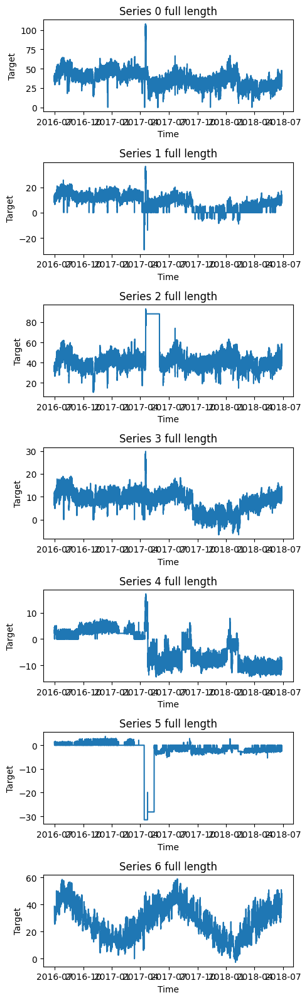

In [109]:
import matplotlib.pyplot as plt
import pandas as pd

fig, axes = plt.subplots(7, 1, figsize=(5, 16), sharex=False)

for i, (item, ax) in enumerate(zip(dataset.test_data.dataset, axes)):
    target = item["target"]
    start = item["start"]
    freq = item["freq"]
    index = pd.date_range(start=start.to_timestamp(), periods=len(target), freq=freq)
    ax.plot(index, target)
    ax.set_title(f"Series {i} full length")
    ax.set_xlabel("Time")
    ax.set_ylabel("Target")

plt.tight_layout()
plt.show()

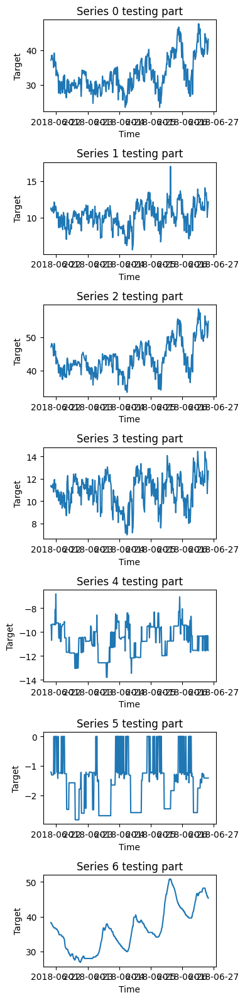

In [110]:
import matplotlib.pyplot as plt
import pandas as pd

fig, axes = plt.subplots(7, 1, figsize=(4, 16), sharex=False)

for i, (item, ax) in enumerate(zip(dataset.test_data.dataset, axes)):
    target = item["target"]
    start = item["start"]
    freq = item["freq"]
    index = pd.date_range(start=start.to_timestamp(), periods=len(target), freq=freq)
    ax.plot(index[-dataset.prediction_length:], target[-dataset.prediction_length:])
    ax.set_title(f"Series {i} testing part")
    ax.set_xlabel("Time")
    ax.set_ylabel("Target")

plt.tight_layout()
plt.show()

In [ ]:
# for i, item_id in enumerate(item_ids):
#         plot_single_item(ax[i], item_id)

In [ ]:

# num_time_series_subset = 7
# prediction_length = dataset.prediction_length
# print(prediction_length)

# tsdf = tsdf[tsdf.index.get_level_values('item_id').isin(tsdf.item_ids[:num_time_series_subset])]
# train_tsdf, test_tsdf_ground_truth = tsdf.train_test_split(prediction_length=prediction_length)
# test_tsdf = generate_test_X(train_tsdf, prediction_length)

In [94]:
# from tabpfn_time_series.plot import plot_actual_ts

# plot_actual_ts(train_tsdf, test_tsdf_ground_truth)\

In [69]:
# len(train_tsdf), len(test_tsdf_ground_truth), len(test_tsdf), len(tsdf)

(484400, 487760, 3360, 487760)

In [11]:
# dataset.test_data.dataset

In [111]:
from tabpfn_time_series import TabPFNTimeSeriesPredictor, TabPFNMode

predictor = TabPFNTSPredictor(
    ds_prediction_length=dataset.prediction_length,
    ds_freq=dataset.freq,
    context_length=4096,
    tabpfn_mode=TabPFNMode.LOCAL,
)

forecasts = predictor.predict(dataset.test_data.dataset)

# train_tsdf, test_tsdf, pred = predictor._predict_batch_TimeSeriesDataFrame(dataset.test_data.dataset)


GPU 1::   0%|          | 0/1 [00:00<?, ?it/s]/home/turbo/mambaforge-pypy3/envs/time_series/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [0, 1] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/home/turbo/mambaforge-pypy3/envs/time_series/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [0, 1] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/home/turbo/mambaforge-pypy3/envs/time_series/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [0, 1] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/home/turbo/mambaforge-pypy3/envs/time_series/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [0, 1] duri

In [112]:
# dataset.test_data.dataset

In [113]:
# forecast_0 = forecasts[0]
# forecast_0.median.shape
len(forecasts)
# forecast_0.plot(ax = ax[0])

7

In [115]:
forecasts[0], forecasts[1]

(QuantileForecast(array([[44.828224, 44.589443, 44.334732, ..., 29.089966, 29.181488,
         29.230858],
        [44.954742, 44.718483, 44.5028  , ..., 33.49127 , 33.37722 ,
         33.269558],
        [45.0327  , 44.805958, 44.60588 , ..., 35.827858, 35.65632 ,
         35.477226],
        ...,
        [45.300312, 45.10169 , 44.95158 , ..., 42.34659 , 42.18761 ,
         42.018204],
        [45.380566, 45.19063 , 45.048584, ..., 44.138706, 43.974236,
         43.772255],
        [45.489376, 45.321068, 45.19469 , ..., 46.63924 , 46.437492,
         46.22342 ]], dtype=float32)), start_date=Period('2018-06-26 20:00', '15T'), forecast_keys=['0.1', '0.2', '0.3', '0.4', '0.5', '0.6', '0.7', '0.8', '0.9'], item_id=None, info=None),
 QuantileForecast(array([[44.828224, 44.589443, 44.334732, ..., 29.089966, 29.181488,
         29.230858],
        [44.954742, 44.718483, 44.5028  , ..., 33.49127 , 33.37722 ,
         33.269558],
        [45.0327  , 44.805958, 44.60588 , ..., 35.827858, 35.656

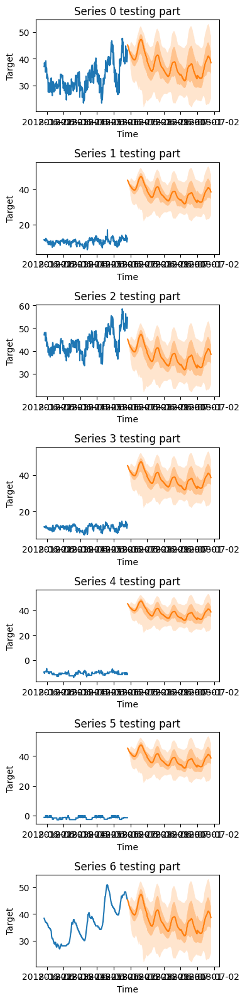

In [114]:
import matplotlib.pyplot as plt
import pandas as pd

fig, axes = plt.subplots(7, 1, figsize=(4, 16), sharex=False)

for i, (item, ax) in enumerate(zip(dataset.test_data.dataset, axes)):
    target = item["target"]
    start = item["start"]
    freq = item["freq"]
    index = pd.date_range(start=start.to_timestamp(), periods=len(target), freq=freq)
    ax.plot(index[-dataset.prediction_length:], target[-dataset.prediction_length:])
    # ax.plot(index[-dataset.prediction_length:], forecasts[i].median)
    forecasts[i].plot(ax = ax)
    ax.set_title(f"Series {i} testing part")
    ax.set_xlabel("Time")
    ax.set_ylabel("Target")

plt.tight_layout()
plt.show()

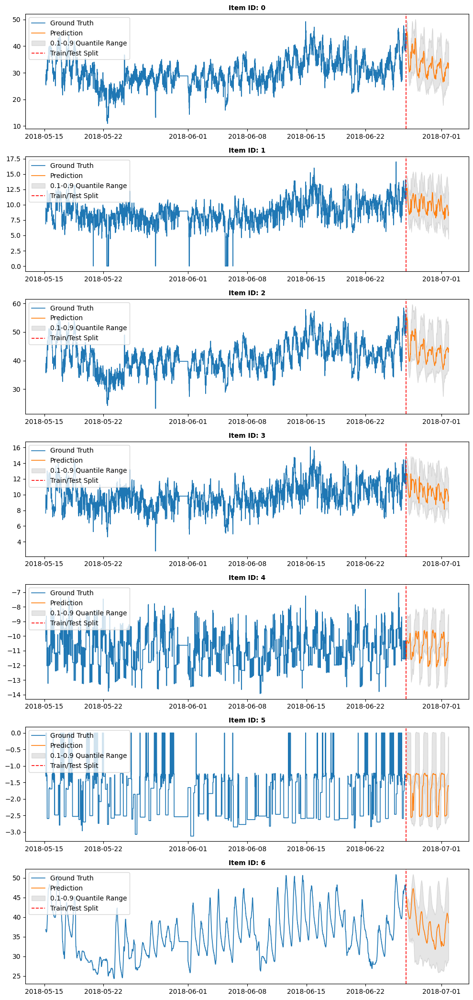

In [17]:
from tabpfn_time_series.plot import plot_pred_and_actual_ts

plot_pred_and_actual_ts(
    train=train_tsdf,
    test=test_tsdf,
    pred=pred,
    item_ids=list(train_tsdf.item_ids),
    # show_quantiles=True,
)

## Results

Running the above cell will generate a csv file called `all_results.csv` under the `results/tabpfn_ts` folder containing the results for the Chronos model on the gift-eval benchmark. We can display the csv file using the follow code:

In [26]:
res

,MSE[mean],MSE[0.5],MAE[0.5],MASE[0.5],MAPE[0.5],sMAPE[0.5],MSIS,RMSE[mean],NRMSE[mean],ND[0.5],mean_weighted_sum_quantile_loss
None,98.491295,98.491295,6.142826,0.663009,0.844857,0.846364,4.97864,9.924278,0.606204,0.375222,0.29201


In [8]:
import pandas as pd

df = pd.read_csv(f"../results/{model_name}/all_results.csv")
df

,dataset,model,eval_metrics/MSE[mean],eval_metrics/MSE[0.5],eval_metrics/MAE[0.5],eval_metrics/MASE[0.5],eval_metrics/MAPE[0.5],eval_metrics/sMAPE[0.5],eval_metrics/MSIS,eval_metrics/RMSE[mean],eval_metrics/NRMSE[mean],eval_metrics/ND[0.5],eval_metrics/mean_weighted_sum_quantile_loss,domain,num_variates
0,m4_weekly/W/short,tabpfn_ts,218095.516606,218095.516606,249.352368,2.054154,0.062038,0.063341,18.725226,467.006977,0.085081,0.045428,0.037043,Econ/Fin,1
1,bizitobs_l2c/H/short,tabpfn_ts,59.039776,59.039776,4.946666,0.485770,0.562060,0.667656,3.658850,7.683734,0.414173,0.266638,0.210046,Web/CloudOps,7
2,bizitobs_l2c/H/medium,tabpfn_ts,78.745433,78.745433,4.947976,0.490156,0.464801,0.771996,3.580094,8.873862,0.537326,0.299607,0.237516,Web/CloudOps,7
3,bizitobs_l2c/H/long,tabpfn_ts,98.492392,98.492392,6.141444,0.663101,0.844479,0.845980,4.982419,9.924333,0.606207,0.375137,0.291841,Web/CloudOps,7
